In [0]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive/My Drive/notebooks

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /gdrive
/gdrive/My Drive/notebooks


In [0]:
from google.colab import files
%cd ~/
!mkdir .kaggle
%cd .kaggle/
files.upload()
%cd /content/
!kaggle datasets download -d vikramtiwari/pix2pix-dataset
!unzip pix2pix-dataset.zip
# %cd edges2shoes/
# !mkdir vals
# !mv edges2shoes/val vals/val
# %cd /gdrive/My Drive/notebooks

/root
mkdir: cannot create directory ‘.kaggle’: File exists
/root/.kaggle


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
  inflating: edges2shoes/edges2shoes/train/8201_AB.jpg  
  inflating: edges2shoes/edges2shoes/train/8202_AB.jpg  
  inflating: edges2shoes/edges2shoes/train/8203_AB.jpg  
  inflating: edges2shoes/edges2shoes/train/8204_AB.jpg  
  inflating: edges2shoes/edges2shoes/train/8205_AB.jpg  
  inflating: edges2shoes/edges2shoes/train/8206_AB.jpg  
  inflating: edges2shoes/edges2shoes/train/8207_AB.jpg  
  inflating: edges2shoes/edges2shoes/train/8208_AB.jpg  
  inflating: edges2shoes/edges2shoes/train/8209_AB.jpg  
  inflating: edges2shoes/edges2shoes/train/820_AB.jpg  
  inflating: edges2shoes/edges2shoes/train/8210_AB.jpg  
  inflating: edges2shoes/edges2shoes/train/8211_AB.jpg  
  inflating: edges2shoes/edges2shoes/train/8212_AB.jpg  
  inflating: edges2shoes/edges2shoes/train/8213_AB.jpg  
  inflating: edges2shoes/edges2shoes/train/8214_AB.jpg  
  inflating: edges2shoes/edges2shoes/train/8215_AB.jpg  
  inflating: edges2shoes/edges2shoes/train/8216_AB.jp

In [0]:
%cd edges2shoes/
!mkdir vals
!mv edges2shoes/val vals/val
%cd /gdrive/My Drive/notebooks

/content/edges2shoes
/gdrive/My Drive/notebooks


# Configs

In [0]:
import torch
import torchvision
import torchvision.transforms as transforms
import torchvision.utils as vutils

import matplotlib.pyplot as plt
import numpy as np 
import random
import math

import os

In [0]:
TRAIN_DATA_PATH = os.path.dirname('/content/edges2shoes/edges2shoes/')
VAL_DATA_PATH = os.path.dirname('/content/edges2shoes/vals/')

modelName = "pix2pix-edges2shoes"
log_PATH = os.path.join("/gdrive/My Drive/notebooks", "logs","pix2pix")

batch_size = 4
incetance_norm = True if batch_size==1 else False
workers = 2

epochs = 15

gf_dim = 64
df_dim = 64

L1_lambda = 100.0

in_w = in_h = 256
c_dim = 3

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

plt.rc('font',size =15)

manualSeed = 3734
print("Random Seed: ",manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  3734


# Data loading

In [0]:
transform = transforms.Compose(
    [
     transforms.Resize((in_h,in_w*2)),
     transforms.ToTensor(),
     transforms.Normalize((0.5,),(0.5,)),
     ]
)

def transform_inverse (y):
  t= None
  if y.size()[0]==1:
    t=torchvision.transforms.Normalize((-1,),(2,))
  else :
    t=torchvision.transforms.Normalize((-1,-1,-1),(2,2,2))
  return t(y)

def batch_transform_inverse(y):
  x = y.new(*y.size())
  if y.size()[1]==1:
    x[:, 0, :, :] = y[:, 0, :, :] * 2 - 1
  else:
    x[:, 0, :, :] = y[:, 0, :, :] * 2 - 1
    x[:, 1, :, :] = y[:, 1, :, :] * 2 - 1 
    x[:, 2, :, :] = y[:, 2, :, :] * 2 - 1
  return x

In [0]:
train_set = torchvision.datasets.ImageFolder(root=TRAIN_DATA_PATH,transform=transform)
train_loader = torch.utils.data.DataLoader(train_set,batch_size=batch_size,
                                          shuffle =True, num_workers=workers)

test_set = torchvision.datasets.ImageFolder(root=VAL_DATA_PATH, transform=transform)
test_loader = torch.utils.data.DataLoader(test_set, batch_size=batch_size,shuffle = False, num_workers=workers)

train_iter = iter(train_loader)
test_iter = iter(test_loader)

torch.Size([4, 3, 256, 512])


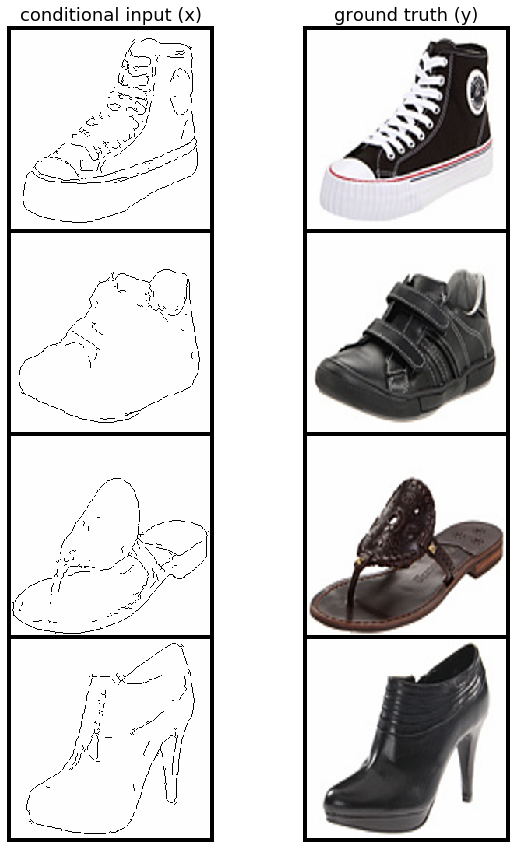

In [0]:
import matplotlib.pyplot as plt

def batch_data_split(batch_images, in_h):
  return batch_images[:,:,:,:in_h],batch_images[:,:,:,in_h:]

def compare_imshow(first_batch, second_batch, first_title="first_batch", second_title ="second_batch", nrow=1, third_batch =None, third_title="third_batch"):
  # Plot the first batch
  plt.figure(figsize=(15,15))
  plt.subplot(1,3,1)
  plt.axis("off")
  plt.title(first_title)
  plt.imshow(np.transpose(vutils.make_grid(first_batch, nrow=nrow,padding=5, normalize=True).cpu(),(1,2,0)))
  # Plot the fake images from the last epoch
  plt.subplot(1,3,2)
  plt.axis("off")
  plt.title(second_title)
  plt.imshow(np.transpose(vutils.make_grid(second_batch, nrow=nrow,padding=5, normalize=True).cpu(),(1,2,0)))

  if third_batch is not None:
    plt.subplot(1,3,3)
    plt.axis("off")
    plt.title(third_title)
    plt.imshow(np.transpose(vutils.make_grid(third_batch, nrow=nrow,padding=5, normalize=True).cpu(),(1,2,0)))


real_batch, _ = next(iter(train_loader))
x, y = batch_data_split(real_batch.to(device), in_h)
compare_imshow(x,y,"conditional input (x)","ground truth (y)")
print(real_batch.size())

# ops

In [0]:
def conv_bn_layer(in_channels,out_channels,kernel_size,stride=1,padding=0,instance_norm=False):
  if instance_norm == True:
    return nn.Sequential(
        nn.Conv2d(in_channels,out_channels,kernel_size,stride=stride,padding=padding),
        nn.InstanceNorm2d(out_channels,momentum=0.1,eps=1e-5),
    )
  else:
    return nn.Sequential(
        nn.Conv2d(in_channels,out_channels,kernel_size,stride=stride,padding=padding),
        nn.BatchNorm2d(out_channels,momentum=0.1,eps=1e-5),
    )
    
def tconv_bn_layer(in_channels,out_channels,kernel_size,stride=1,padding=0,output_padding=0,instance_norm=False):
  if instance_norm == True:
    return nn.Sequential(
      nn.ConvTranspose2d(in_channels,out_channels,kernel_size,stride=stride,padding=padding,output_padding=output_padding),
      nn.InstanceNorm2d(out_channels,momentum=0.1,eps=1e-5),
  )
  else:
    return nn.Sequential(
      nn.ConvTranspose2d(in_channels,out_channels,kernel_size,stride=stride,padding=padding,output_padding=output_padding),
      nn.BatchNorm2d(out_channels,momentum=0.1,eps=1e-5),
  )

def tconv_layer(in_channels,out_channels,kernel_size,stride=1,padding=0,output_padding=0,):
  return nn.ConvTranspose2d(in_channels,out_channels,kernel_size,stride=stride,padding=padding,output_padding=output_padding)

def conv_layer(in_channels,out_channels,kernel_size,stride=1,padding=0):
    return nn.Conv2d(in_channels,out_channels,kernel_size,stride=stride,padding=padding)

def fc_layer(in_features,out_features):
  return nn.Linear(in_features,out_features)

def fc_bn_layer(in_features,out_features,instance_norm=False):
  if instance_norm == True:
    return nn.Sequential(
      nn.Linear(in_features,out_features),
      nn.InstanceNorm2d(out_features)
  )
  else:
    return nn.Sequential(
      nn.Linear(in_features,out_features),
      nn.BatchNorm2d(out_features)
  )

# Models

In [0]:
import torch.nn as nn
import torch.nn.functional as F

#256x256 U-net base Generator

class Generator(nn.Module):
  def __init__(self,incetance_norm=False):#input : 256x256
    super(Generator,self).__init__()
    self.e1 = conv_layer(c_dim,gf_dim,4,2,1) #128x128
    self.e2 = conv_bn_layer(gf_dim,gf_dim*2,4,2,1,instance_norm=incetance_norm)#64x64
    self.e3 = conv_bn_layer(gf_dim*2,gf_dim*4,4,2,1,instance_norm=incetance_norm)#32x32
    self.e4 = conv_bn_layer(gf_dim*4,gf_dim*8,4,2,1,instance_norm=incetance_norm)#16x16
    self.e5 = conv_bn_layer(gf_dim*8,gf_dim*8,4,2,1,instance_norm=incetance_norm)#8x8
    self.e6 = conv_bn_layer(gf_dim*8,gf_dim*8,4,2,1,instance_norm=incetance_norm)#4x4
    self.e7 = conv_bn_layer(gf_dim*8,gf_dim*8,4,2,1,instance_norm=incetance_norm)#2x2
    self.e8 = conv_layer(gf_dim*8,gf_dim*8,4,2,1)#1x1

    self.d1 = tconv_bn_layer(gf_dim*8,gf_dim*8,4,2,1,instance_norm=incetance_norm)#2x2
    self.d2 = tconv_bn_layer(gf_dim*8*2,gf_dim*8,4,2,1,instance_norm=incetance_norm)#4x4
    self.d3 = tconv_bn_layer(gf_dim*8*2,gf_dim*8,4,2,1,instance_norm=incetance_norm)#8x8
    self.d4 = tconv_bn_layer(gf_dim*8*2,gf_dim*8,4,2,1,instance_norm=incetance_norm)#16x16
    self.d5 = tconv_bn_layer(gf_dim*8*2,gf_dim*4,4,2,1,instance_norm=incetance_norm)#32x32
    self.d6 = tconv_bn_layer(gf_dim*4*2,gf_dim*2,4,2,1,instance_norm=incetance_norm)#64x64
    self.d7 = tconv_bn_layer(gf_dim*2*2,gf_dim*1,4,2,1,instance_norm=incetance_norm)#128x128
    self.d8 = tconv_layer(gf_dim*1*2,c_dim,4,2,1)#256x256
    self.tanh = nn.Tanh()

  def forward(self,x):
    e1 = self.e1(x)
    e2 = self.e2(F.leaky_relu(e1,0.2))
    e3 = self.e3(F.leaky_relu(e2,0.2))
    e4 = self.e4(F.leaky_relu(e3,0.2))
    e5 = self.e5(F.leaky_relu(e4,0.2))
    e6 = self.e6(F.leaky_relu(e5,0.2))
    e7 = self.e7(F.leaky_relu(e6,0.2))
    e8 = self.e8(F.leaky_relu(e7,0.2))
    d1 = torch.cat([F.dropout(self.d1(F.relu(e8)),0.5,training=True),e7],1)
    d2 = torch.cat([F.dropout(self.d2(F.relu(d1)),0.5,training=True),e6],1)
    d3 = torch.cat([F.dropout(self.d3(F.relu(d2)),0.5,training=True),e5],1)
    d4 = torch.cat([self.d4(F.relu(d3)),e4],1)
    d5 = torch.cat([self.d5(F.relu(d4)),e3],1)
    d6 = torch.cat([self.d6(F.relu(d5)),e2],1)
    d7 = torch.cat([self.d7(F.relu(d6)),e1],1)
    d8 = self.d8(F.relu(d7))

    return self.tanh(d8)

In [0]:
# pixel gan loss (70x70 receptive field)

"""
reference : https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix/issues/39
reference : https://github.com/phillipi/pix2pix/blob/master/models.lua

In fact, a "PatchGAN" is just a convnet! Or you could say all convnets are patchnets: the power of convnets is that they process each image patch identically and independently, which makes things very cheap (# params, time, memory), and, amazingly, turns out to work.

The difference between a PatchGAN and regular GAN discriminator is that rather the regular GAN maps from a 256x256 image to a single scalar output, which signifies "real" or "fake", whereas the PatchGAN maps from 256x256 to an NxN array of outputs X, where each X_ij signifies whether the patch ij in the image is real or fake. Which is patch ij in the input? Well, output X_ij is just a neuron in a convnet, and we can trace back its receptive field to see which input pixels it is sensitive to. In the CycleGAN architecture, the receptive fields of the discriminator turn out to be 70x70 patches in the input image!

This is all mathematically equivalent to if we had manually chopped up the image into 70x70 overlapping patches, run a regular discriminator over each patch, and averaged the results.

Maybe it would have been better if we called it a "Fully Convolutional GAN" like in FCNs... it's the same idea :)
"""

class Discriminator(nn.Module):
  def __init__(self,instance_norm=False):#input : 256x256
    super(Discriminator,self).__init__()
    self.conv1 = conv_layer(c_dim*2,df_dim,4,2,1) # 128x128
    self.conv2 = conv_bn_layer(df_dim,df_dim*2,4,2,1,instance_norm=incetance_norm)# 64x64
    self.conv3 = conv_bn_layer(df_dim*2,df_dim*4,4,2,1,instance_norm=incetance_norm)# 32 x 32
    self.conv4 = conv_bn_layer(df_dim*4,df_dim*8,4,1,1,instance_norm=incetance_norm)# 31 x 31
    self.conv5 = conv_layer(df_dim*8,1,4,1,1)# 30 x 30

    self.sigmoid = nn.Sigmoid()


  def forward(self, x, y):
    xy=torch.cat([x,y],dim=1)
    xy=F.leaky_relu(self.conv1(xy),0.2)
    xy=F.leaky_relu(self.conv2(xy),0.2)
    xy=F.leaky_relu(self.conv3(xy),0.2)
    xy=F.leaky_relu(self.conv4(xy),0.2)
    xy=self.conv5(xy)

    return self.sigmoid(xy)


In [0]:
def weights_init(m):
  classname =m.__class__.__name__
  if classname.find('Conv')!=-1 or classname.find('Linear')!=-1: # for Conv,Linear
    nn.init.normal_(m.weight.data,0.0,0.02)
    nn.init.constant_(m.bias.data,0)
  elif classname.find('BatchNorm')!=-1:# Reference : https://discuss.pytorch.org/t/weight-initialization-for-batchnorm-in-dcgan-tutorial/32351
    nn.init.normal_(m.weight.data,1.0,0.02)
    nn.init.constant_(m.bias.data,0)

# Train Config

In [0]:
import torch.optim as optim
import torch.nn as nn

G = Generator(incetance_norm).to(device)
D = Discriminator(incetance_norm).to(device)

bce_criterion = nn.BCELoss()
L1_criterion = nn.L1Loss()

G_optimizer = optim.Adam(G.parameters(), lr=2e-4,betas=(0.5,0.999))
D_optimizer = optim.Adam(D.parameters(), lr=2e-4,betas=(0.5,0.999))

fixed_condition, _ = next(iter(test_loader))
# for i, (t, _) in enumerate(test_loader):
#   if i ==0:
#     fixed_condition = t
#   elif i ==4:
#     break
#   else:
#     fixed_condition=torch.cat((fixed_condition,t),0)
fixed_condition = fixed_condition.to(device)
fixed_x, fixed_y = batch_data_split(fixed_condition,in_h)

print(D.apply(weights_init))
print(G.apply(weights_init))

Discriminator(
  (conv1): Conv2d(6, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv4): Sequential(
    (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv5): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
  (sigmoid): Sigmoid()
)
Generator(
  (e1): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (e2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=

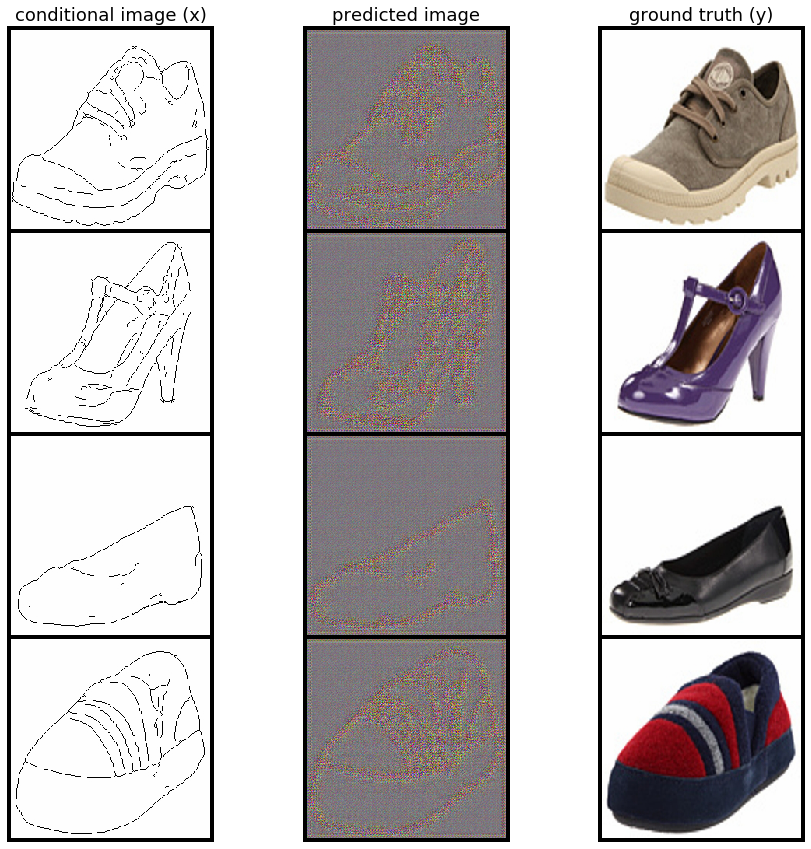

In [0]:
with torch.no_grad():
  fake_batch=G(fixed_x)
compare_imshow(fixed_x,fake_batch,first_title="conditional image (x)",second_title="predicted image",third_batch=fixed_y,third_title="ground truth (y)")

In [0]:
img_list = []
D_losses = []
G_losses = []
G_GAN_losses = []
G_L1_losses=[]


iter_per_plot = 500
plot_per_eps=(int(len(train_loader)/iter_per_plot))
transform_PIL=transforms.ToPILImage()

# Train

In [50]:
for ep in range(epochs):
  for i, (data, _) in enumerate(train_loader):
    b_size= data.shape[0]

    x, y = batch_data_split(data.to(device), in_h)

    real_masks = torch.ones(b_size,1,30,30).to(device)
    fake_masks = torch.zeros(b_size,1,30,30).to(device)

    #Train D
    D.zero_grad()
    real_patch=D(y,x)
    real_gan_loss=bce_criterion(real_patch,real_masks)

    fake=G(x)
    fake_patch = D(fake.detach(),x)
    fake_gan_loss=bce_criterion(fake_patch,fake_masks)

    D_loss = real_gan_loss + fake_gan_loss
    D_loss.backward()
    D_optimizer.step()

    #Train G
    G.zero_grad()
    fake_patch = D(fake,x)
    fake_gan_loss=bce_criterion(fake_patch,real_masks)

    L1_loss = L1_criterion(fake,y)
    G_loss = fake_gan_loss + L1_lambda*L1_loss
    G_loss.backward()
    
    G_optimizer.step()

    if (i+1)%iter_per_plot == 0 :
      print('Epoch [{}/{}], Step [{}/{}], d_loss: {:.4f}, g_loss: {:.4f},D(real): {:.2f}, D(fake):{:.2f},g_loss_gan:{:.4f},g_loss_L1:{:.4f}' 
            .format(ep, epochs, i+1, len(train_loader), D_loss.item(), G_loss.item(),real_patch.mean(), fake_patch.mean(),fake_gan_loss.item(),L1_loss.item()))
      G_losses.append(G_loss.item())
      D_losses.append(D_loss.item())
      G_GAN_losses.append(fake_gan_loss.item())
      G_L1_losses.append(L1_loss.item())

      with torch.no_grad():
        G.eval()
        fake = G(fixed_x).detach().cpu()
        G.train()
      figs=plt.figure(figsize=(10,10))

      plt.subplot(1,3,1)
      plt.axis("off")
      plt.title("conditional image (x)")
      plt.imshow(np.transpose(vutils.make_grid(fixed_x, nrow=1,padding=5, normalize=True).cpu(),(1,2,0)))

      plt.subplot(1,3,2)
      plt.axis("off")
      plt.title("fake image")
      plt.imshow(np.transpose(vutils.make_grid(fake, nrow=1,padding=5, normalize=True).cpu(),(1,2,0)))
      
      plt.subplot(1,3,3)
      plt.axis("off")
      plt.title("ground truth (y)")
      plt.imshow(np.transpose(vutils.make_grid(fixed_y, nrow=1,padding=5, normalize=True).cpu(),(1,2,0)))
      
      plt.savefig(os.path.join(log_PATH,modelName+"-"+str(ep) +".png"))
      plt.close()
      img_list.append(figs)

Epoch [0/20], Step [500/12457], d_loss: 0.5452, g_loss: 24.7084,D(real): 0.65, D(fake):0.10,g_loss_gan:2.3966,g_loss_L1:0.2231
Epoch [0/20], Step [1000/12457], d_loss: 0.9850, g_loss: 17.5365,D(real): 0.81, D(fake):0.22,g_loss_gan:1.5804,g_loss_L1:0.1596
Epoch [0/20], Step [1500/12457], d_loss: 0.4213, g_loss: 16.0887,D(real): 0.81, D(fake):0.10,g_loss_gan:2.3498,g_loss_L1:0.1374
Epoch [0/20], Step [2000/12457], d_loss: 0.7584, g_loss: 13.0045,D(real): 0.73, D(fake):0.23,g_loss_gan:1.5296,g_loss_L1:0.1147
Epoch [0/20], Step [2500/12457], d_loss: 0.6990, g_loss: 18.7080,D(real): 0.97, D(fake):0.32,g_loss_gan:1.1767,g_loss_L1:0.1753
Epoch [0/20], Step [3000/12457], d_loss: 0.4421, g_loss: 18.9776,D(real): 0.98, D(fake):0.12,g_loss_gan:2.2101,g_loss_L1:0.1677
Epoch [0/20], Step [3500/12457], d_loss: 1.7528, g_loss: 21.6145,D(real): 1.00, D(fake):0.07,g_loss_gan:2.8046,g_loss_L1:0.1881
Epoch [0/20], Step [4000/12457], d_loss: 0.6130, g_loss: 14.0195,D(real): 0.67, D(fake):0.25,g_loss_gan:1

KeyboardInterrupt: ignored

# Evaluation

In [0]:
import io
from PIL import Image
from copy import deepcopy

pil_img=[]
for img in img_list:
  buf = io.BytesIO()
  img.savefig(buf, format='png')
  buf.seek(0)
  pil_img.append(deepcopy(Image.open(buf)))
  buf.close()

p_img =[ p for i, p in enumerate(pil_img) if i%4==0]

In [0]:
from PIL import Image
transform_PIL=transforms.ToPILImage()

pil_img[0].save(modelName+'.gif', save_all=True,append_images=pil_img[1:], optimize=False, duration=10, loop=0)
pil_img[-1].save(modelName+"_last_result.png")


p_img[0].save(modelName+'compact.gif', save_all=True,append_images=p_img[1:], optimize=False, duration=10, loop=0)
pil_img[-1].save(modelName+"_last_result.png")

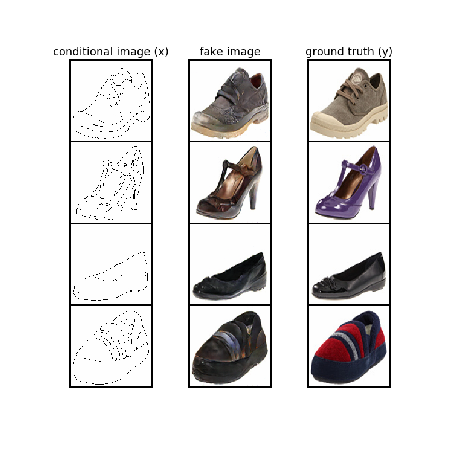

In [78]:
import matplotlib.animation as animation
from IPython.display import HTML
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(i, animated=True)] for i in p_img]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

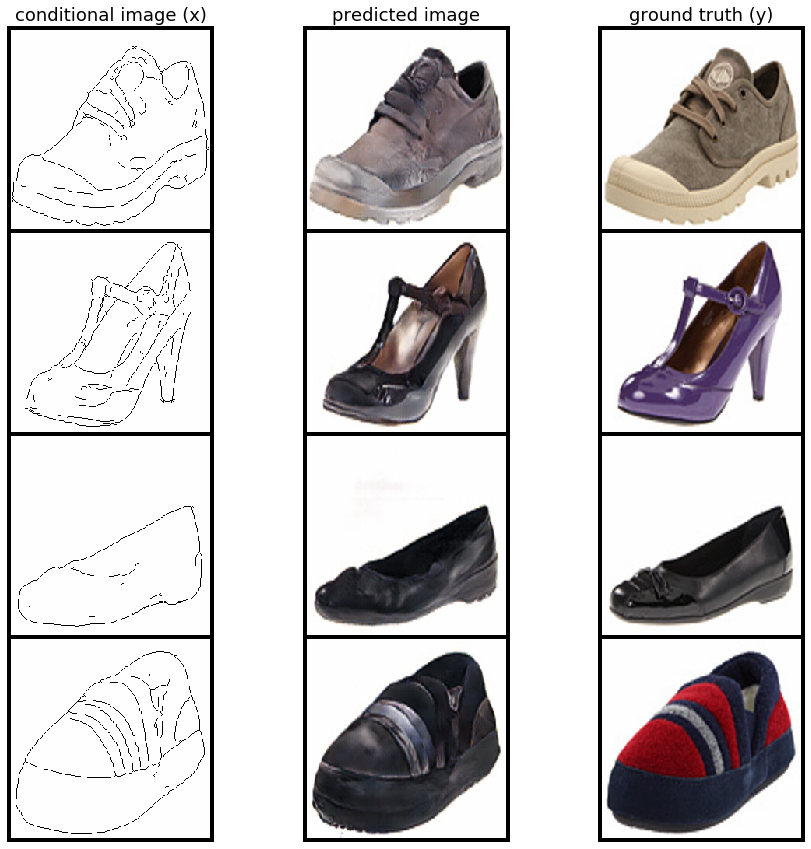

In [79]:
test_batch, _ =  next(iter(test_loader))
test_x, test_y= batch_data_split(test_batch, in_h)

with torch.no_grad():
  G.eval()
  fake_batch=G(test_x.to(device))
compare_imshow(test_x,fake_batch,first_title="conditional image (x)",second_title="predicted image",third_batch=test_y,third_title="ground truth (y)")

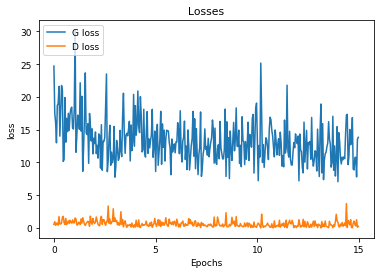

In [81]:
plt.title("Losses")

epsilon = 1/plot_per_eps
X = np.array(range(plot_per_eps*epochs))/plot_per_eps
plt.rc('font',size =9)
plt.plot(X,G_losses,label="G loss")
plt.plot(X,D_losses,label="D loss")
plt.legend(loc=2)
plt.xticks(np.arange(0,epochs+1,5)) 
plt.ylabel("loss")
plt.xlabel("Epochs")
plt.savefig(modelName+"_loss_figure.png")

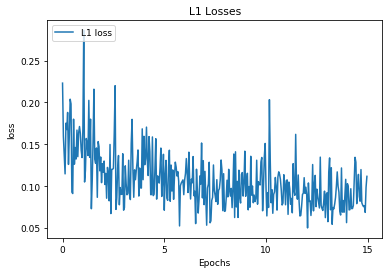

In [82]:
plt.title("L1 Losses")
epsilon = 1/plot_per_eps
X = np.array(range(plot_per_eps*epochs))/plot_per_eps

plt.plot(X,G_L1_losses,label="L1 loss")
plt.legend(loc=2)
plt.xticks(np.arange(0,epochs+1,5)) 
plt.ylabel("loss")
plt.xlabel("Epochs")
plt.savefig(modelName+"_loss_figure.png")

#Model Save

In [83]:
torch.save(D.state_dict(),os.path.join(log_PATH,"D_"+modelName+".pth"))
D.load_state_dict(torch.load(os.path.join(log_PATH,"D_"+modelName+".pth")))

<All keys matched successfully>

In [84]:
torch.save(G.state_dict(),os.path.join(log_PATH,"G_"+modelName+".pth"))
G.load_state_dict(torch.load(os.path.join(log_PATH,"G_"+modelName+".pth")))

<All keys matched successfully>